# 09 - Spektralne metode za začetne probleme PDE
<p style="font-weight: 600; text-align: center;">
Matematično-fizikalni praktikum, avgust 2024 <br>
Luka Skeledžija, 28201079
</p>

<style>
.MJXc-display{
    display: inline-block !important;
    width: 100%;
}
@media print {
    .pagebreak { page-break-before: always; } /* page-break-after works, as well */
}

img{
    width: 100%;
    max-width: 600px !important;
    margin: auto !important;
}

body {
    overflow: hidden;
    max-width: 600px;
    margin: auto;
}

::-webkit-scrollbar {
  width: 0px;
}

table{
    width: 100%;
}

h1 {
    text-transform: uppercase;
    text-align: center;
    background: #222222;
    color: white;
    padding: 8px;
}

blockquote {
    margin-left: 0em!important;
    margin-right: 0em!important;

}

.jp-RenderedHTMLCommon pre, .jp-RenderedHTMLCommon code {

    background-color: var(--jp-layout-color2)!important;
}

.jp-RenderedHTMLCommon pre{
    margin: 0.5em 0em!important;
    padding: 0em 1.5em!important;
}

body {
    counter-reset: h2counter;
}
h1 {
    counter-reset: h2counter;
}
h2:before {
    content: counter(h2counter) ".\0000a0\0000a0";
    counter-increment: h2counter;
    counter-reset: h3counter;
}
h3:before {
    counter-increment: h3counter;
    content: counter(h2counter) "." counter(h3counter) ".\0000a0\0000a0";
  
}




</style>


---

## Uvod

Za reševanje začetnih problemov s parcialnimi diferencialnimi
enačbami (PDE) imamo na voljo dva obsežna razreda metod.
Pri *diferenčnih metodah* na neki način aproksimiramo
časovne in krajevne parcialne odvode s končnimi diferencami.
Reševanje PDE nato prevedemo na reševanje algebrajskih enačb
ali sistemov enačb za približne vrednosti funkcij, ki v teh
diferencah nastopajo.  Diferenčne metode spoznamo pri
naslednji vaji.  Pri tej vaji obravnavamno *spektralne metode*:
pri njih iskano rešitev formalno izrazimo z nekim naborom funkcij,
nato pa v času spremljamo koeficiente v takem razvoju.  Kako se
selimo med krajevno in časovno sliko problema, je odvisno
od posamezne metode.  Osnovne prijeme spoznamo ob Fourierovi
metodi in  metodi končnih elementov s kubičnimi $B$-zlepki ($B$-splines).

Fizikalno ozadje naj bo enorazsežna difuzijska enačba,
ki opisuje na primer temperaturno polje $T(x,t)$ v homogeni
neskončni plasti s končno debelino $a$ brez izvorov toplote:

\begin{equation*}
\frac{\partial T}{\partial t} = D\frac{\partial^2 T}{\partial x^2}
 \>, \qquad 0\le x \le a \>, \qquad D={\lambda\over \rho c} \>.
\end{equation*}

Temperaturo v poljubni točki $x$ ob času $t$ izrazimo
s Fourierovo vrsto

\begin{equation*}
T(x,t) \simeq \sum_{k=0}^{N-1} \widetilde{T}_k(t)
e^{-2\pi\mathrm{i} f_k x} \>,
\end{equation*}

kjer je $f_k = k/a$, torej

\begin{equation*}
\sum_k {\partial\widetilde{T}_k(t)\over\partial t}\,
\mathrm{e}^{-2\pi\mathrm{i} f_k x} =
D \sum_k (-4\pi^2 f_k^2) \, \widetilde{T}_k(t) \,
\mathrm{e}^{-2\pi\mathrm{i} f_k x} \>.
\end{equation*}

Od tod sledi evolucijska enačba za Fourierove koeficiente

\begin{equation}
{\partial\widetilde{T}_k(t)\over\partial t} =
D \, (-4\pi^2 f_k^2) \, \widetilde{T}_k(t) \>.
\end{equation}

Pogosto uporabimo spektralno reprezentacijo za krajevni odvod,
medtem ko časovni korak naredimo z neko eksplicitno integracijsko
shemo, na primer kar po Eulerju

\begin{equation}
\widetilde{T}_k(t+h) = \widetilde{T}_k(t)
+ h D (-4\pi^2 f_k^2) \widetilde{T}_k(t) \>.
\end{equation}

Reprezentacijo $T(x,t)$ v običajnem prostoru nato dobimo
z obratno Fourierovo transformacijo.

Tu lahko v splošnem časovni korak izvedeš po Eulerju, v tem konkretnem primeru
pa obstaja tudi enostavna analitična rešitev enačbe \ref{eq:num}, ki jo lahko uporabiš za primerjavo.
V numerični metodi tako najprej izračunaj Fourierovo reprezentacijo $\widetilde{T}_k(0)$
začetnega pogoja, nato pa jo po Eulerju evolviraj v času.
Pri tem moraš paziti na stabilnost Eulerjeve diferenčne sheme:
pri katerem koli koraku mora veljati
\begin{equation*}
\left\vert \,
{\widetilde{T}_k(t+h)\over \widetilde{T}_k(t)} \,\right\vert
= \left\vert\, 1 + hD(-4\pi^2 f_k^2)\, \right\vert < 1 \>.
\end{equation*}

Nekaj pozornosti zahteva tudi diskretizacija: za vsak $k$
seveda velja  $-f_\mathrm{Nyquist} < f_k < f_\mathrm{Nyquist}$ in s tem povezan
mo\v zen pojav \emph{aliasinga} (Kaj je že to?). Ta pojav lahko \v studira\v s,
\v ce se spomni\v s, da obstaja analiti\v cna re\v sitev FT Gaussove funkcije (je spet Gaussova funkcija) - kaj se z le-to dogaja znotraj dovoljenega frekvenčnega intervala?
\v Ce izbereš veliko število točk, je seveda smiselno uporabiti kar algoritem FFT.
Temperaturni profil $T_j(t)\equiv T(x,t)$ ob poljubnem času
nato dobiš z inverzno FFT.

Pri razvoju $T(x,t)$ nismo omejeni
na trigonometrične funkcije.  Rešitev PDE na $0\le x\le a$
lahko aproksimiramo tudi z drugačno vrsto funkcij,
na primer kubičnimi $B$-zlepki,
\begin{equation}
T(x,t) = \sum_{k=-1}^{N+1} c_k(t) B_k(x) \>,
\end{equation}
kjer je $B_k(x)$ kubični zlepek s središčem okrog $x=x_k$.
aastnosti $B$-zlepkov so navedene v dodatku.  Tako zasnujemo
{\sl metodo končnih elementov}, s \emph{kolokacijskim pogojem}, da naj se zlepek
ujema z rešitvijo v določenih izbranih točkah.  Podobno kot pri Fourierovi metodi
tudi pri tej metodi zahtevamo, da razvoj 
zadošča osnovni PDE in robnim pogojem.  Razvoj 
vstavimo v PDE in izvrednotimo rezultat pri $x=x_j$.
(Interval $[0,a]$ diskretiziramo na $N$ podintervalov širine
$\Delta x$ s točkami $x_j=j{\Delta x}$, kjer je $j=0,1,\ldots,N$.
Za kolokacijo je smiselno izbrati enake točke kot za diskretno
mrežo.)  Tako dobimo
$$
\sum_{k=-1}^{N+1} \dot{c}_k(t) B_k(x_j) =
D \sum_{k=-1}^{N+1} c_k(t) B_k''(x_j) \>, \quad j = 0,1,\ldots,N \>.
$$
Upoštevamo lastnosti $B$-zlepkov in dobimo sistem
diferencialnih enačb za koeficiente $c_j(t)$:

$$
\dot{c}_{j-1}(t) + 4\dot{c}_j(t) + \dot{c}_{j+1}(t)
= {6D\over{\Delta x}^2} \left(c_{j-1}(t) - 2c_j(t) + c_{j+1}(t) \right) \>,
$$

kjer je $j=0,1,\ldots,N$.  Iz robnega pogoja pri $x=0$
ugotovimo $c_{-1} = -4c_0 - c_1$. Če dodamo še zahtevo za 'naravni' kubični
zlepek, da je na robu $\sum_{k=-1}^{N+1} c_k(t) B_k''(x=(0,a))=0$, sledi
 $c_0=c_N=0$ in $c_{-1}=-c_1$ ter $c_{N-1}=-c_{N+1}$.
Reševanje prejšnje enačbe smo torej prevedli
na reševanje matričnega sistema
$$
{\mathbf{A}}\frac{d\vec{c}}{dt} = {\mathbf{B}}\vec{c} \>,
$$
kjer je
$$
{\mathbf{A}} = \left(
\begin{array}{ccccccc}
4 & 1 \cr
1 & 4 & 1 \cr
  & 1 & 4 & 1 \cr
  &   &   & \vdots \cr
  &   &   & 1 & 4 & 1 & \cr
  &   &   &   & 1 & 4 & 1 \cr
  &   &   &   &   & 1 & 4
\end{array}
\right) \>, \qquad
{\mathbf{B}} = {6D\over{\Delta x}^2} \left(
\begin{array}{rrrrrrr}
-2 & 1 \cr
1 & -2 & 1 \cr
  & 1 & -2 & 1 \cr
  &   &   & \vdots \cr
  &   &   & 1 & -2 & 1 & \cr
  &   &   &   & 1 & -2 & 1 \cr
  &   &   &   &   & 1 & -2
\end{array}
\right)
$$
in $\vec{c} = (c_1(t), c_2(t), \ldots c_{N-1}(t))^\mathrm{T}$.
Začetni pogoj za PDE je $T(x_j,0) = f(x_j)$, torej je začetni
približek za kolokacijsko aproksimacijo
$$
{\mathbf{A}}\vec{c}^{\>0} = \vec{f} \>,
$$
kjer je $\vec{f}=(f(x_1),f(x_2),\ldots,f(x_{N-1}))^\mathrm{T}$.
To zdaj rešujemo s kako metodo, ki jo poznamo iz prejšnjih
nalog, recimo z eksplicitno Eulerjevo metodo: ob zaporednih
časih $n{\Delta t}$ dobimo
$$
\vec{c}^{\>n+1} = \vec{c}^{\>n} + {\Delta t}{ A}^{-1}{ B}\vec{c}^{\>n}
 = ( { 1} + {\Delta t}{ A}^{-1}{ B})\vec{c}^{\>n} \>.
$$
Ob poljubnem času nato dobimo temperaturni profil tako,
da znova izračunamo vsoto.
Ker nam je že znano, da je Eulerjeva ob predolgih časovnih korakih
lahko nestabilna, lahko uporabimo stabilno implicitno metodo,
kjer v vsakem časovnem koraku rešujemo
$$
  \left( { A} - \frac{\Delta t}{2}{ B}\right)\vec{c}^{\>n+1} \>
 = \left( { A} + \frac{\Delta t}{2}{ B}\right)\vec{c}^{\>n} \>.
$$


In [9]:
# Standardized imports for MFPR
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rc
import pandas as pd
import seaborn as sns
from IPython.display import HTML, display
import markdown
import datetime
import scipy.special as sp
import scipy.stats as stats
import scipy.optimize as opt
import scipy.interpolate as interp
from matplotlib import animation
import logging
import timeit
import time
# Function and constants defitition for Juptyer notebook (rerun for hot reload of imports)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['text.usetex'] = True
plt.rcParams["grid.linestyle"]="dashed"
plt.rcParams["figure.edgecolor"] = "black"
# equivalent to rcParams['animation.html'] = 'html5'
rc('animation', html='html5')

def log_msg(msg, log_filename='my_log_file.log'):
    # Configure the logging module if not already configured
    if not logging.root.handlers:
        logging.basicConfig(
            filename=log_filename,
            level=logging.DEBUG,
            format='%(asctime)s - %(name)s - %(levelname)s - %(message)s'
        )

    # Create a logger for the function (you can replace 'my_function' with your desired logger name)
    logger = logging.getLogger('EIGENSTATES')

    # Log the provided message
    logger.info(msg)
def clear_log_file(log_filename='my_log_file.log'):
    with open(log_filename, 'w'):
        pass

def centerHTML(html, text=""):
    text = markdown.markdown(text)
    return '<div style="display: flex; align-items: center; flex-direction: column;">' + html + f'</div><div style="display: flex; align-items: center; flex-direction: column;padding-top: 15px;"><small style="max-width: 600px">{text}</small></div>'

def insertHTMLVideo(filename, text=""):
    return centerHTML(f'<video controls src="{filename}" style="max-width: 600px;width:100%"></video>', text)

def insertHTMLAudio(filename, text=""):
    return centerHTML(f'<audio controls src="{filename}" style="max-width: 600px;width:100%"></audio>', text)


clear_log_file()
log_msg('START logging...')


## Naloga

Reši difuzijsko enačbo v eni razsežnosti $x\in [0,a]$

z začetnim pogojem po plasti gaussovsko porazdeljene temperature 

\begin{equation*}
  T(x,0) \propto \mathrm{e}^{-(x-a/2)^2 / \sigma^2}
\end{equation*}

(izberi razumne vrednosti za $D$, $a$ in $\sigma$)
in

1. periodičnim robnim pogojem $T(0,t) = T(a,t)$.
2. homogenim Dirichletovim robnim pogojem $T(0,t) = T(a,t)=0$.

po Fourierovi metodi in homogenih Dirichletovih robnih pogojih $T(0,t)=T(a,t)=0$ ter primerjaj obe metodi. Kolokacijsko metodo uporabi ob Gaussovem začetnem pogoju

**Dodatna naloga:** Izberi si še kakšen primer začetnih pogojev, recimo:
$$
T(x,0) = f(x) = \sin (\pi x/a)
$$

in preizkusi obe metodi.

## Reševanje PDE

Najprej si poglejmo ustrezne začetne pogoje. Periodični robni pogoj $T(0,t) = T(a,t)$ si lahko fizikalno interpretiramo kot da je palica 1 telo in je toplotno izolirana od okolice - toplota nikamor ne odteka. V ozadju homogenih (Dirichletovih) robnih pogojev $T(0,t) = T(a,t)=0$ pa stoji predpostavka, da iz robov palice ves čas črpamo toploto in tako vzdržujemo konstantno temperaturo. Začetni pogoj je v obeh primerih Gaussova porazdelitev temperature s središčem v $a/2$. 

### Fourierova metoda

Najprej analizirajmo enačbo s homogenimi robnimi pogoji. Difuzijsko lahko poenostavimo z uvedbo spremenljivk $\tau$ in $\xi$, tako da jo prepišemo v obliko

$$ 
\frac{\partial T}{\partial \tau} = \frac{\partial^2 T}{\partial \xi^2},
$$

kjer je $\tau = D t / a^2$ in $\xi = x/a$. Arbitrarno izberemo vrednosti $D = 0.5$ in $a = 1$. Temperatura je porazdeljena Gaussovsko in sicer kot

$$
T(x, 0) = e^{-(x - x_0)^2 / \sigma^2}
$$

za vrednosti $\sigma = a/10$ in $x_0 = a/2$. Da zadostimo homogenim robnim pogojem uporabimo lastnost, da gre liha funkcija lahko simetrično skozi izhodišče in naredimo liho razširitev začetnega pogoja.

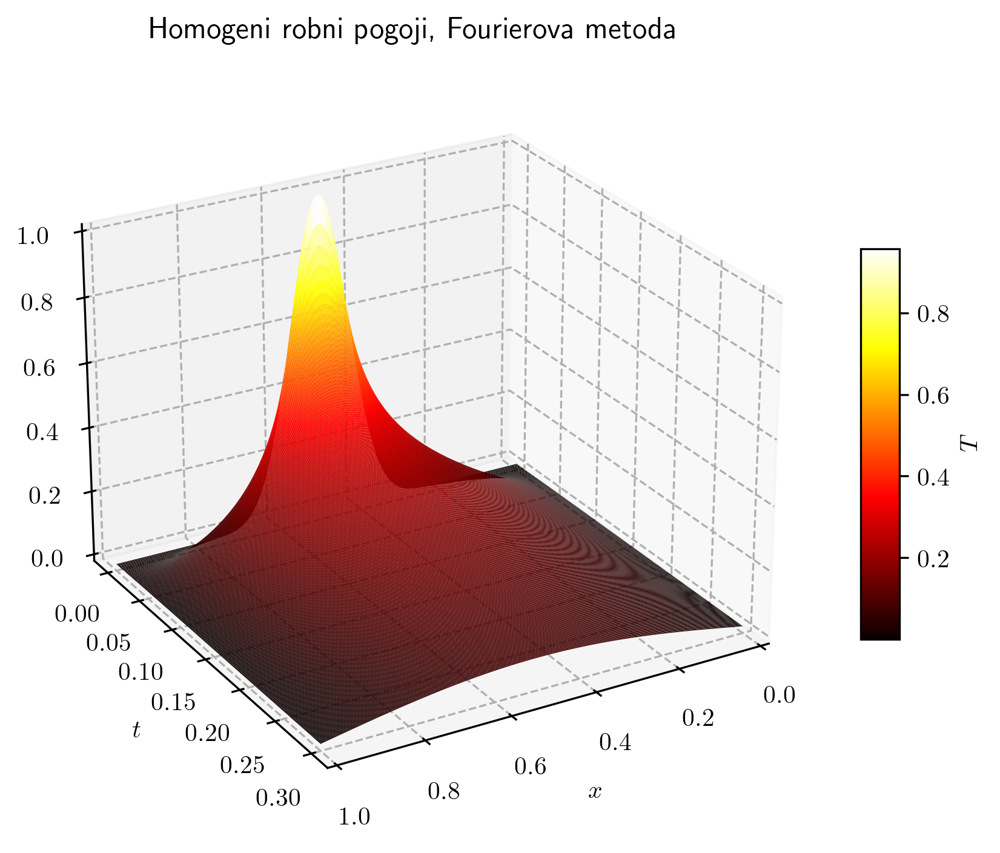

In [36]:
a = 1
x_0 = a/2
sigma = a/10
t_max = 0.3

N_default = 100
x = np.linspace(0, a, 3*N_default)
t = np.linspace(0, t_max, 3*N_default)
T_0 = np.exp(-(x - x_0)**2/(sigma**2))

h_x = np.diff(x)[0]
h_t = np.diff(t)[0]

# Začetni pogoj na robu
T_0[0] = 0
T_0[-1] = 0

# Fourierova metoda

def hom_fourier_sol_(T_0, t, h_x, h_t, D=0.5):
    N = 2 * len(T_0)
    T_0 = np.concatenate((-T_0, T_0))
    t = np.linspace(0, 2*np.max(t), N)
    T_new = np.zeros((N, N), dtype=complex)
    fft_T_0 = np.fft.fft(T_0)
    k = np.fft.fftfreq(N, d=h_x)
    for i in range(N):
        T_new[:, i] = np.exp(-4. * D * t * np.pi**2. * k[i]**2.) * fft_T_0[i]
    for j in range(N):
        T_new[j, :] = np.fft.ifft(T_new[j, :])
    T_new = T_new[:N//2,N//2:]
    T_new = T_new.real
    return T_new

sol_f = hom_fourier_sol_(T_0, t, h_x, h_t)
x, t = np.meshgrid(x, t)
fig = plt.figure()
ax = plt.axes(projection='3d')
surf = ax.plot_surface(x, t, sol_f, rstride=1, cstride=1, cmap='hot', edgecolor='none')
ax.set_xlim(0, a)
ax.set_zlim(0, 1)
ax.set_title("Homogeni robni pogoji, Fourierova metoda")
ax.set_xlabel("$x$")
ax.set_ylabel("$t$")
ax.set_zlabel("$T$")
ax.view_init(25, 60)
cb = fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)
cb.set_label("$T$")
plt.tight_layout()
plt.show()


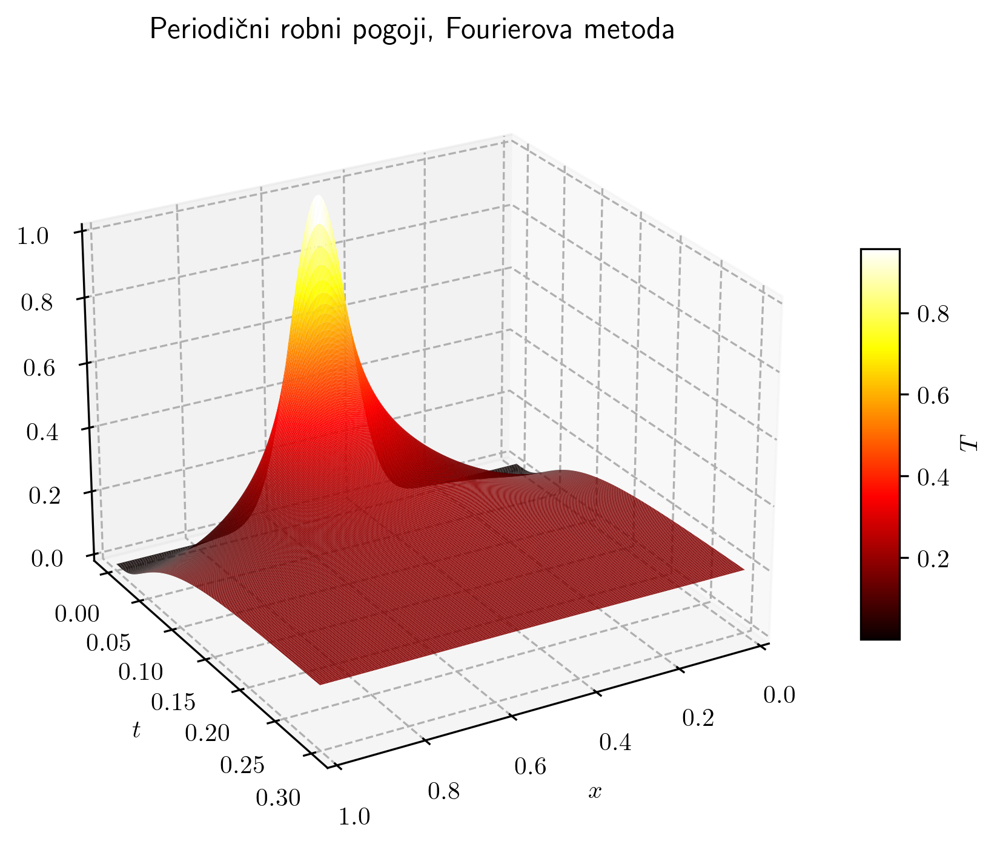

In [11]:
a = 1
x_0 = a/2
sigma = a/10
t_max = 0.3

N_default = 100
x = np.linspace(0, a, 3*N_default)
t = np.linspace(0, t_max, 3*N_default)
T_0 = np.exp(-(x - x_0)**2/(sigma**2))

h_x = np.diff(x)[0]
h_t = np.diff(t)[0]

# Začetni pogoj na robu
T_0[0] = 0
T_0[-1] = 0

# Fourierova metoda

def hom_fourier_sol_(T_0, t, h_x, h_t, D=0.5):
    N = len(T_0)
    T_new = np.zeros((N, N), dtype=complex)
    fft_T_0 = np.fft.fft(T_0)
    k = np.fft.fftfreq(N, d=h_x)
    for i in range(N):
        T_new[:, i] = np.exp(-4. * D * t * np.pi**2. * k[i]**2.) * fft_T_0[i]
    for j in range(N):
        T_new[j, :] = np.fft.ifft(T_new[j, :])
    T_new = T_new.real
    return T_new

sol_p = hom_fourier_sol_(T_0, t, h_x, h_t)
x, t = np.meshgrid(x, t)
fig = plt.figure()
ax = plt.axes(projection='3d')
surf = ax.plot_surface(x, t, sol_p, rstride=1, cstride=1, cmap='hot', edgecolor='none')
ax.set_xlim(0, a)
ax.set_zlim(0, 1)
ax.set_title("Periodični robni pogoji, Fourierova metoda")
ax.set_xlabel("$x$")
ax.set_ylabel("$t$")
ax.set_zlabel("$T$")
ax.view_init(25, 60)
cb = fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)
cb.set_label("$T$")
plt.tight_layout()
plt.show()


Največjo razliko opazimo po daljšem času. Pri homogenih robnih pogojih se oblika Gaussovke ohranja, energija iz sistema odteka. V primeru periodičnih robnih pogojev pa dosežemo temperaturno ravnovesje.  

### Metoda končnih elementov

Rešimo PDE se z metodo končnih elementov. Kvalitativno gledano je rezultat enak kot zgoraj. 

In [12]:
def B_k(delta, k, x0):
    term1 = x0 - delta * (k - 2)
    term2 = x0 - delta * (k - 1)
    term3 = x0 - delta * k
    term4 = x0 - delta * (k + 1)
    term5 = x0 - delta * (k + 2)

    if x0 <= delta * (k - 2):
        return 0.0
    elif x0 <= delta * (k - 1):
        return (term1 ** 3) / (delta ** 3)
    elif x0 <= delta * k:
        return (term1 ** 3) / (delta ** 3) - 4 * (term2 ** 3) / (delta ** 3)
    elif x0 <= delta * (k + 1):
        return 4 * (term4 ** 3) / (delta ** 3) - (term5 ** 3) / (delta ** 3)
    elif x0 <= delta * (k + 2):
        return -(term5 ** 3) / (delta ** 3)
    else:
        return 0.0

def spline_sol(x_0, t, x, D=0.5, a=1.):
    t1 = time.time()
    N = len(x)
    t_max = t[-1]
    dx = a/N
    dt = t_max/N

    main_diagonal_A = 4 * np.ones(N)
    off_diagonal_A = np.ones(N - 1)
    A = np.diag(main_diagonal_A, 0) + np.diag(off_diagonal_A, -1) + np.diag(off_diagonal_A, 1)

    main_diagonal_B = -2 * np.ones(N)
    off_diagonal_B = np.ones(N - 1)
    B = 6 * D / dx**2 * (np.diag(main_diagonal_B, 0) + np.diag(off_diagonal_B, -1) + np.diag(off_diagonal_B, 1))

    C = np.linalg.inv(A - dt / 2 * B) @ (A + dt / 2 * B)

    c0 = np.linalg.solve(A, x_0)
    
    T = []
    for t_ in t:
        if t_ == 0:
            c = c0
        c = C@c
        T_xs = []
        for xi in range(len(x)):
            T_x = 0
            for k in range(xi-1,N+2):
                if k == -1:
                    c_k = -c[1]
                elif k == 0 or k == N:
                    c_k = 0
                elif k == N+1:
                    c_k = -c[N-1]
                else:
                    c_k = c[k]
                T_x += c_k*B_k(dx, k, x[xi])
            T_xs.append(T_x)
        T.append(T_xs)
    T = np.array(T)
    T = np.concatenate((np.array([x_0]), T[:-1]))
    dt = time.time() - t1
    return T, dt

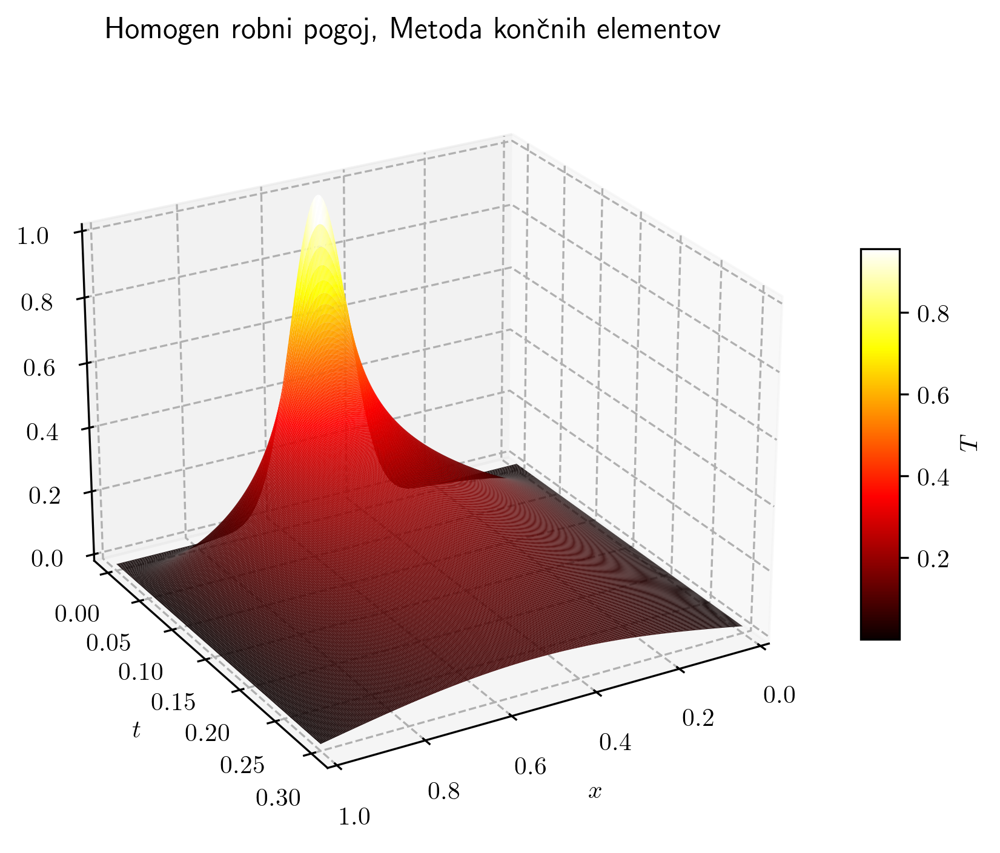

In [13]:
a = 1
x_0 = a/2
sigma = a/10
t_max = 0.3

N_default = 100
x = np.linspace(0, a, 3*N_default)
t = np.linspace(0, t_max, 3*N_default)
T_0 = np.exp(-(x - x_0)**2/(sigma**2))

h_x = np.diff(x)[0]
h_t = np.diff(t)[0]

T_0[0] = 0
T_0[-1] = 0

sol = spline_sol(T_0, t, x)
x, t = np.meshgrid(x, t)
fig = plt.figure()
ax = plt.axes(projection='3d')
surf = ax.plot_surface(x, t, sol[0], rstride=1, cstride=1, cmap='hot', edgecolor='none')
ax.set_xlim(0, a)
ax.set_zlim(0, 1)
ax.set_title("Homogen robni pogoj, Metoda končnih elementov")
ax.set_xlabel("$x$")
ax.set_ylabel("$t$")
ax.set_zlabel("$T$")
ax.view_init(25, 60)
cb = fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)
cb.set_label("$T$")
plt.tight_layout()
plt.show()


Izračunajmo še abs. razliko obeh metod pri $N=100$. Odstopanja so manjša od $0.012$.

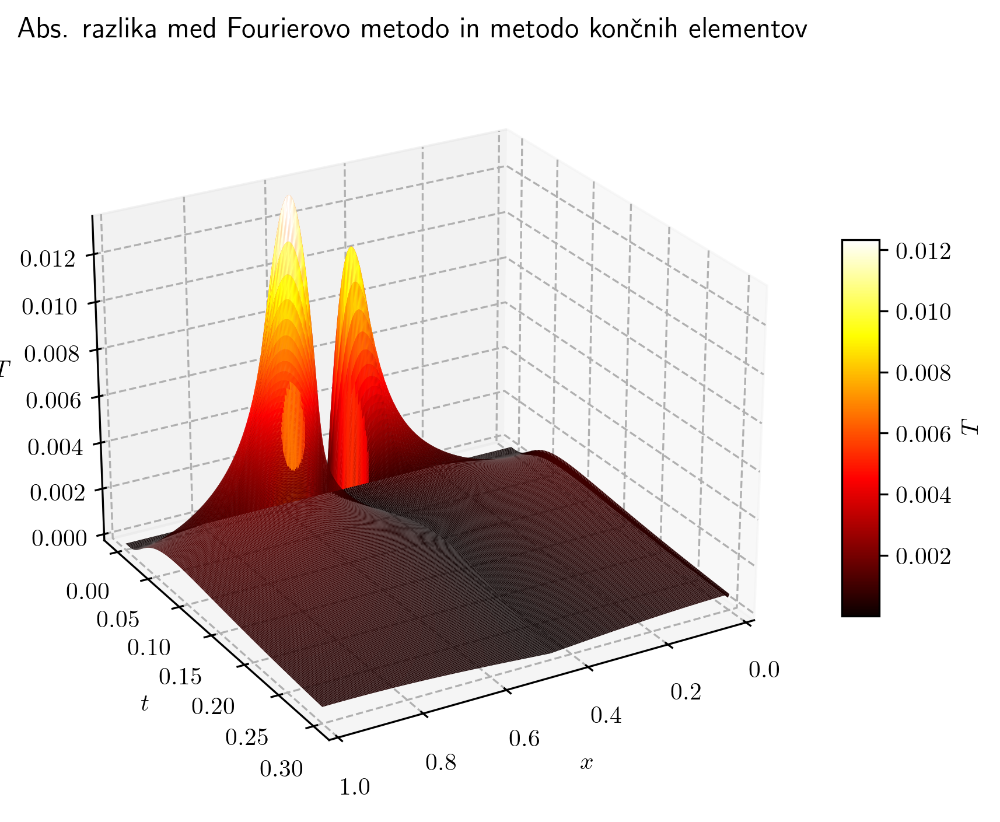

In [14]:
fig = plt.figure()
ax = plt.axes(projection='3d')
surf = ax.plot_surface(x, t, np.abs(sol[0] - sol_f), rstride=1, cstride=1, cmap='hot', edgecolor='none')
ax.set_xlim(0, a)
ax.set_title("Abs. razlika med Fourierovo metodo in metodo končnih elementov")
ax.set_xlabel("$x$")
ax.set_ylabel("$t$")
ax.set_zlabel("$T$")
ax.view_init(25, 60)
cb = fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)
cb.set_label("$T$")
plt.tight_layout()
plt.show()


Če primerjamo hitrost obeh metod, vidimo, da je Fourierova metoda nekaj velikostnih redov hitrejša. Kot dodatek smo želeli primerjati tudi porabo pomnilnika, vendar se nam to ni najbolj izšlo - nisem povsem prepričan v interpretacijo rezultatov. Verjetno bi morali programe poganjati prek zunanjih skript, ne pa samo preverjati porabe znotraj Pythona samega. Ali morda izbrati kakšno implementacijo v jeziku C++ - tam bi se dalo to veliko bolje oceniti, ker se dejansko izvaja samo napisan program in ne celotna interpretacija jezika Python.

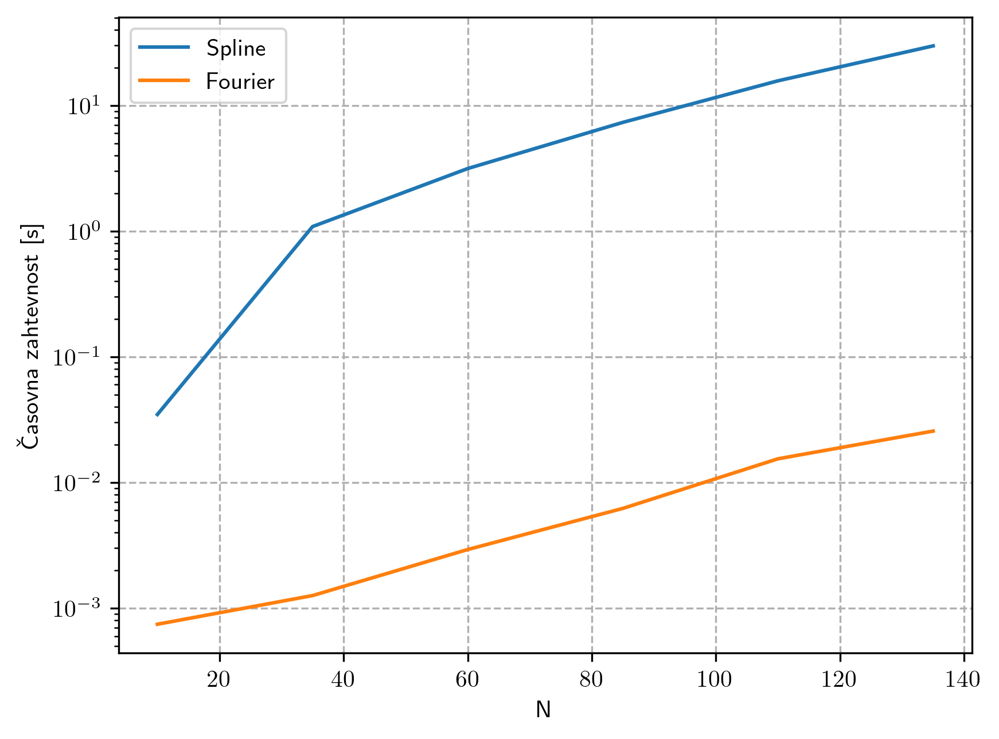

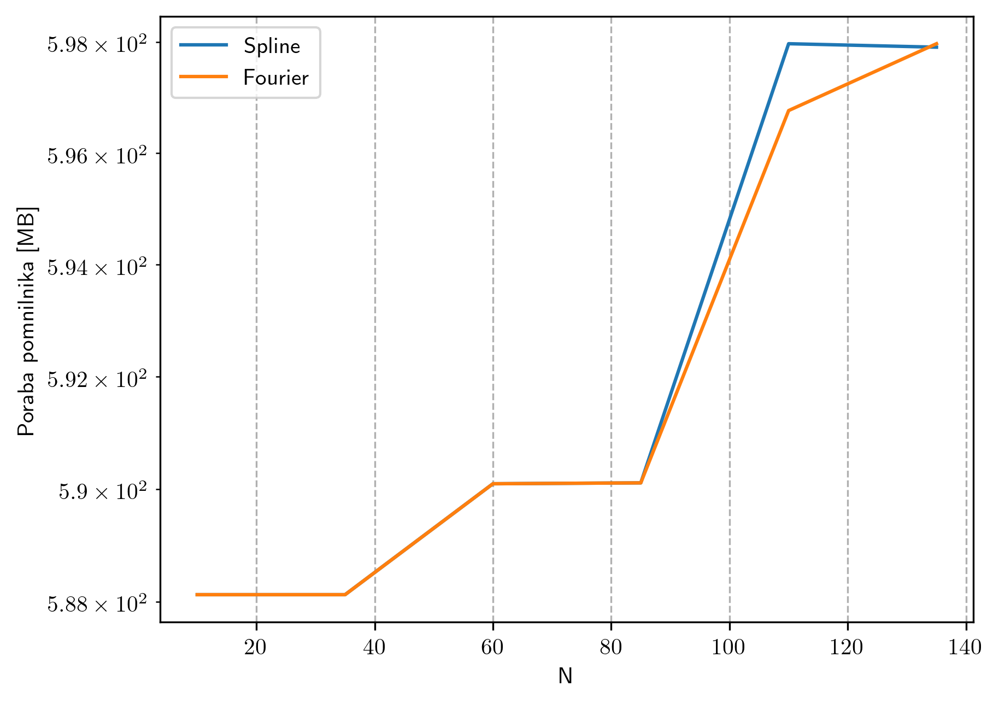

In [32]:
import psutil
def measure_performance(func, *args):
    start_time = time.time()
    result = func(*args)
    end_time = time.time()
    execution_time = end_time - start_time
    
    # Measure memory usage
    process = psutil.Process()
    memory_info = process.memory_info()
    memory_usage = memory_info.rss / 1024 / 1024  # in MB
    
    return result, execution_time, memory_usage

a = 1
x_0 = a/2
sigma = a/10
t_max = 0.3

spline_res = []
fourier_res = []

import gc

NS = range(10, 150, 25)
for N_default in NS:
    x = np.linspace(0, a, 3*N_default)
    t = np.linspace(0, t_max, 3*N_default)
    T_0 = np.exp(-(x - x_0)**2/(sigma**2))

    h_x = np.diff(x)[0]
    h_t = np.diff(t)[0]

    T_0[0] = 0
    T_0[-1] = 0

    gc.collect()
    sol2, time2, memory2 = measure_performance(hom_fourier_sol_, T_0, t, h_x, h_t)
    fourier_res.append((sol2, time2, memory2))


    gc.collect()
    sol, time_, memory_ = measure_performance(spline_sol, T_0, t, x)
    spline_res.append((sol, time_, memory_))

# Plot execution time
plt.plot(NS, [res[1] for res in spline_res], label="Spline")
plt.plot(NS, [res[1] for res in fourier_res], label="Fourier")
plt.xlabel("N")
plt.ylabel("Časovna zahtevnost [s]")
plt.legend()
plt.grid()
plt.yscale("log")
plt.show()

# Plot memory usage
plt.plot(NS, [res[2] for res in spline_res], label="Spline")
plt.plot(NS, [res[2] for res in fourier_res], label="Fourier")
plt.xlabel("N")
plt.ylabel("Poraba pomnilnika [MB]")
plt.legend()
plt.grid()
plt.yscale("log")
plt.show()

## Dodatek: Sinusni začetni pogoj

Analiziramo celotno stvar še enkrat, le da si za začetni pogoj izberemo sinusno krivuljo $T(x,0) = f(x) = \sin (\pi x/a)$.

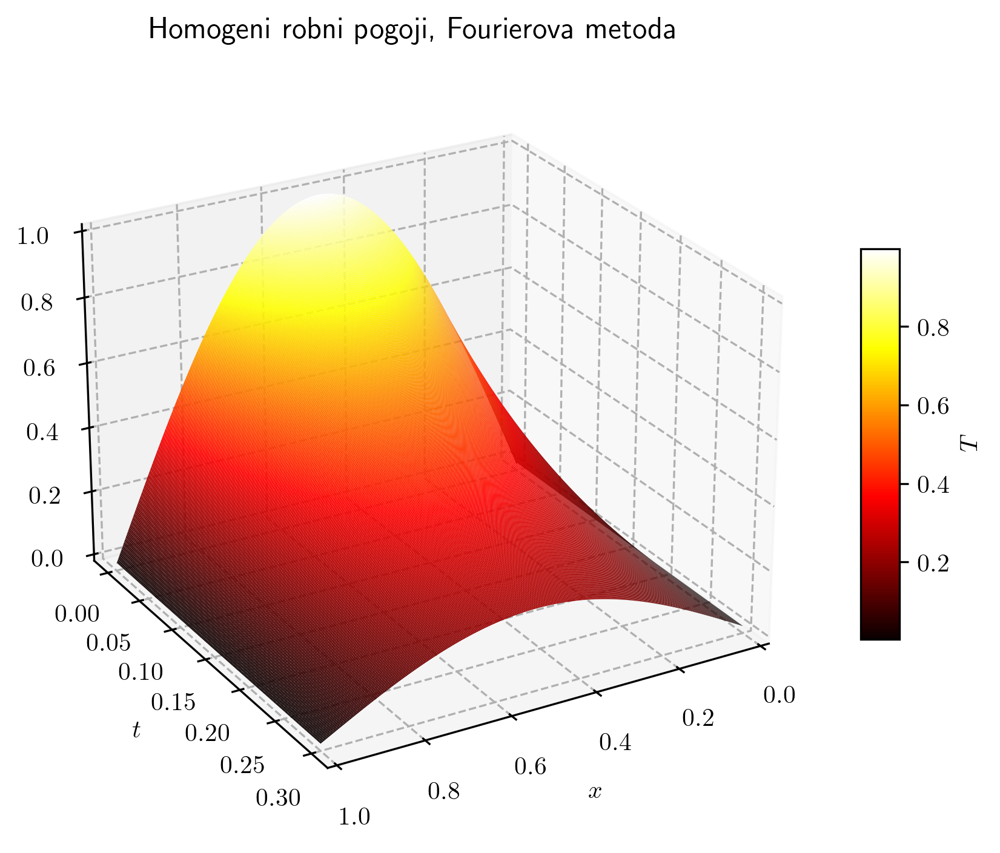

In [33]:
a = 1
x_0 = a/2
sigma = a/10
t_max = 0.3

N_default = 100
x = np.linspace(0, a, 3*N_default)
t = np.linspace(0, t_max, 3*N_default)
T_0 = np.sin(np.pi*x/a)

h_x = np.diff(x)[0]
h_t = np.diff(t)[0]

# Začetni pogoj na robu
T_0[0] = 0
T_0[-1] = 0

# Fourierova metoda

def hom_fourier_sol_(T_0, t, h_x, h_t, D=0.5):
    N = 2 * len(T_0)
    T_0 = np.concatenate((-T_0, T_0))
    t = np.linspace(0, 2*np.max(t), N)
    T_new = np.zeros((N, N), dtype=complex)
    fft_T_0 = np.fft.fft(T_0)
    k = np.fft.fftfreq(N, d=h_x)
    for i in range(N):
        T_new[:, i] = np.exp(-4. * D * t * np.pi**2. * k[i]**2.) * fft_T_0[i]
    for j in range(N):
        T_new[j, :] = np.fft.ifft(T_new[j, :])
    T_new = T_new[:N//2,N//2:]
    T_new = T_new.real
    return T_new

sol_f = hom_fourier_sol_(T_0, t, h_x, h_t)
x, t = np.meshgrid(x, t)
fig = plt.figure()
ax = plt.axes(projection='3d')
surf = ax.plot_surface(x, t, sol_f, rstride=1, cstride=1, cmap='hot', edgecolor='none')
ax.set_xlim(0, a)
ax.set_zlim(0, 1)
ax.set_title("Homogeni robni pogoji, Fourierova metoda")
ax.set_xlabel("$x$")
ax.set_ylabel("$t$")
ax.set_zlabel("$T$")
ax.view_init(25, 60)
cb = fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)
cb.set_label("$T$")
plt.tight_layout()
plt.show()


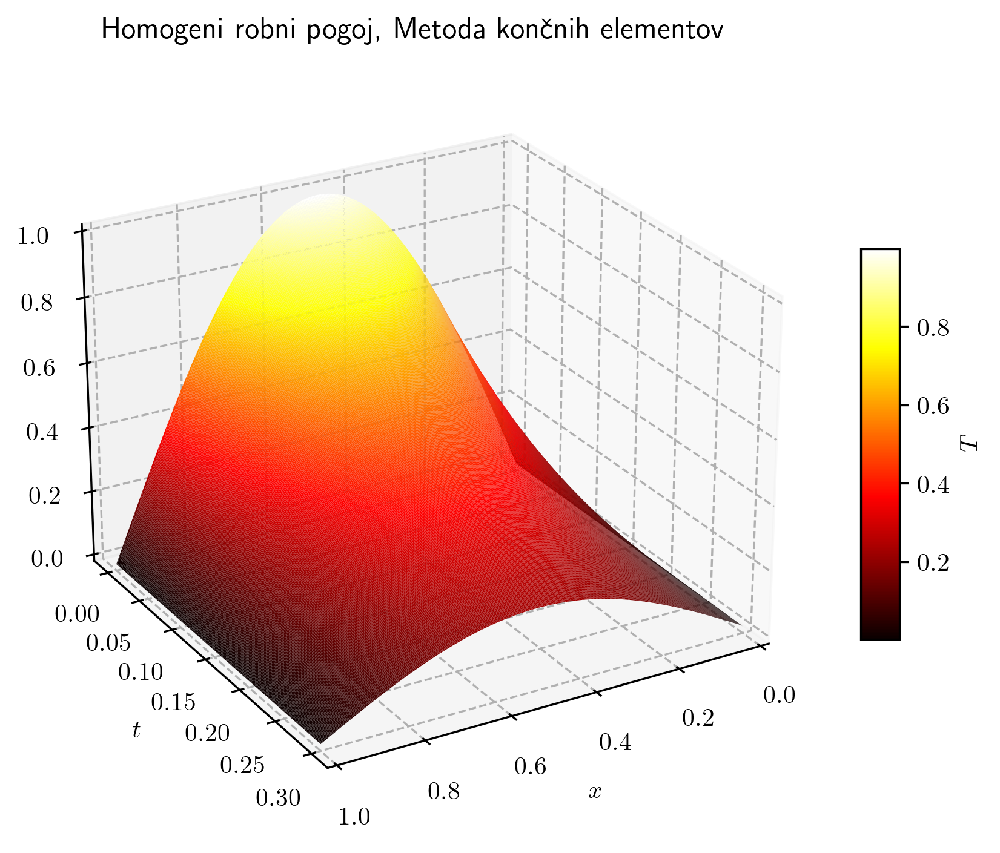

In [34]:
a = 1
x_0 = a/2
sigma = a/10
t_max = 0.3

N_default = 100
x = np.linspace(0, a, 3*N_default)
t = np.linspace(0, t_max, 3*N_default)
T_0 = np.sin(np.pi*x/a)

h_x = np.diff(x)[0]
h_t = np.diff(t)[0]

T_0[0] = 0
T_0[-1] = 0

sol = spline_sol(T_0, t, x)
x, t = np.meshgrid(x, t)
fig = plt.figure()
ax = plt.axes(projection='3d')
surf = ax.plot_surface(x, t, sol[0], rstride=1, cstride=1, cmap='hot', edgecolor='none')
ax.set_xlim(0, a)
ax.set_zlim(0, 1)
ax.set_title("Homogeni robni pogoj, Metoda končnih elementov")
ax.set_xlabel("$x$")
ax.set_ylabel("$t$")
ax.set_zlabel("$T$")
ax.view_init(25, 60)
cb = fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)
cb.set_label("$T$")
plt.tight_layout()
plt.show()


Rezultati so podobni kot prej, vendar malo drugačne oblike. Napaka med metodama je malce manjša, ampak brez bistvenih razlik.

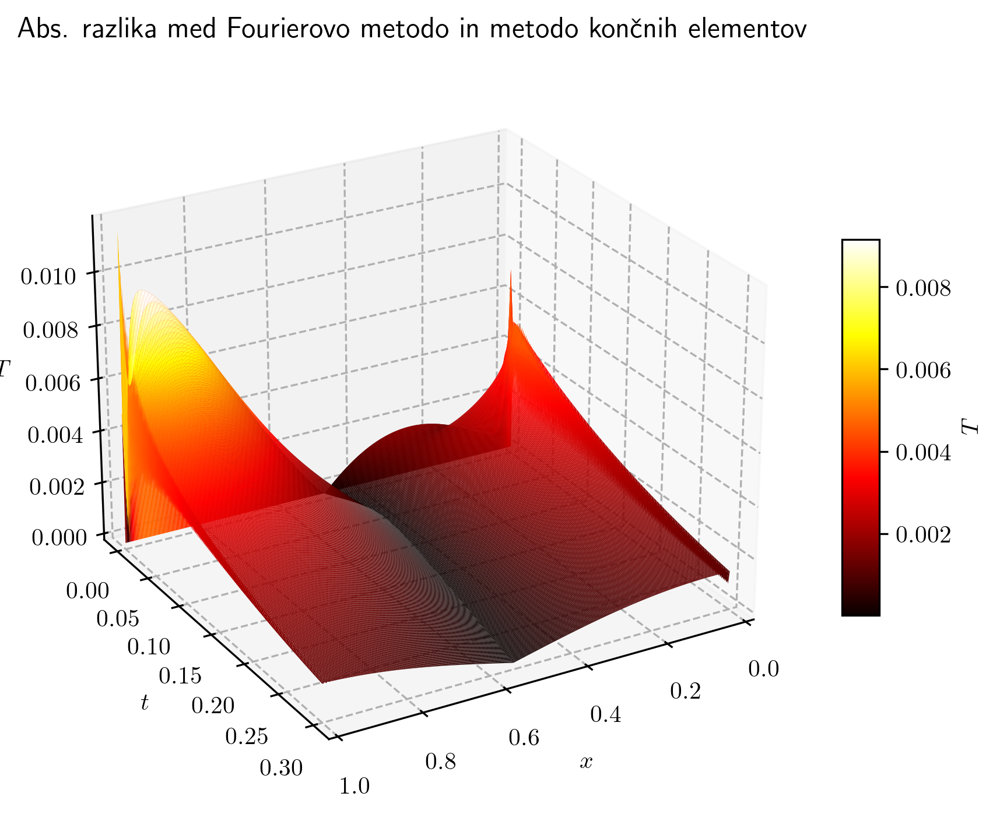

In [31]:
fig = plt.figure()
ax = plt.axes(projection='3d')
surf = ax.plot_surface(x, t, np.abs(sol[0] - sol_f), rstride=1, cstride=1, cmap='hot', edgecolor='none')
ax.set_xlim(0, a)
ax.set_title("Abs. razlika med Fourierovo metodo in metodo končnih elementov")
ax.set_xlabel("$x$")
ax.set_ylabel("$t$")
ax.set_zlabel("$T$")
ax.view_init(25, 60)
cb = fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)
cb.set_label("$T$")
plt.tight_layout()
plt.show()


Kot prikazano spodaj, je Fourierova metoda bistveno hitrejša. Meritev porabe pomnilnika pa še vedno izgleda relativno slabo in nezanesljivo.

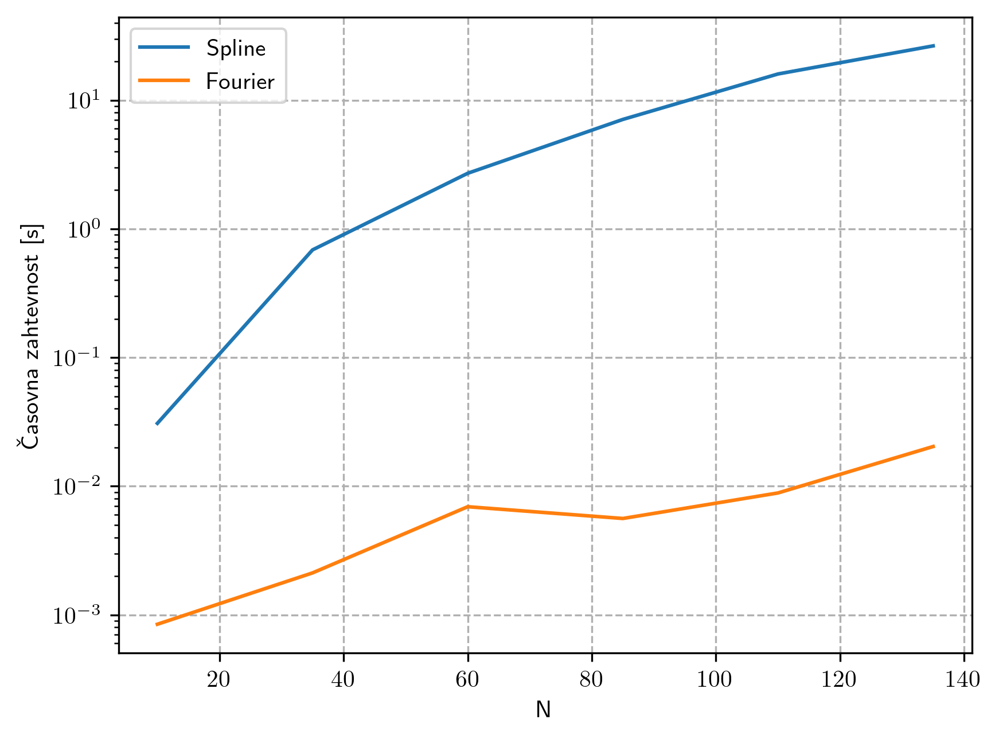

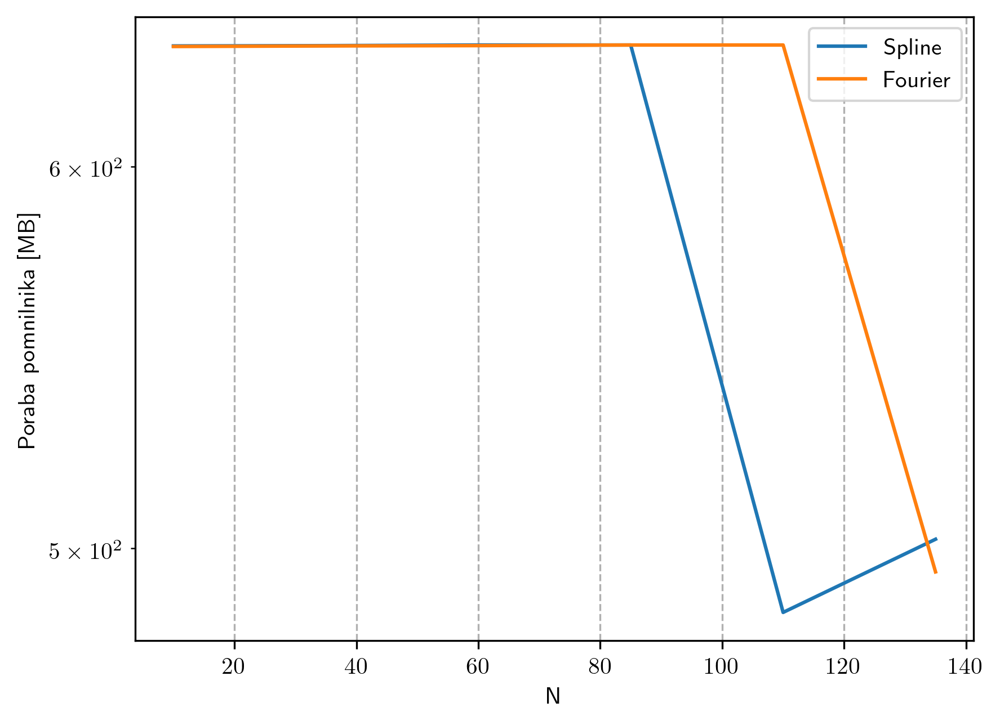

In [35]:
import psutil
def measure_performance(func, *args):
    start_time = time.time()
    result = func(*args)
    end_time = time.time()
    execution_time = end_time - start_time
    
    # Measure memory usage
    process = psutil.Process()
    memory_info = process.memory_info()
    memory_usage = memory_info.rss / 1024 / 1024  # in MB
    
    return result, execution_time, memory_usage

a = 1
x_0 = a/2
sigma = a/10
t_max = 0.3

spline_res = []
fourier_res = []

import gc

NS = range(10, 150, 25)
for N_default in NS:
    x = np.linspace(0, a, 3*N_default)
    t = np.linspace(0, t_max, 3*N_default)
    T_0 = np.sin(np.pi*x/a)

    h_x = np.diff(x)[0]
    h_t = np.diff(t)[0]

    T_0[0] = 0
    T_0[-1] = 0

    gc.collect()
    sol2, time2, memory2 = measure_performance(hom_fourier_sol_, T_0, t, h_x, h_t)
    fourier_res.append((sol2, time2, memory2))


    gc.collect()
    sol, time_, memory_ = measure_performance(spline_sol, T_0, t, x)
    spline_res.append((sol, time_, memory_))

# Plot execution time
plt.plot(NS, [res[1] for res in spline_res], label="Spline")
plt.plot(NS, [res[1] for res in fourier_res], label="Fourier")
plt.xlabel("N")
plt.ylabel("Časovna zahtevnost [s]")
plt.legend()
plt.grid()
plt.yscale("log")
plt.show()

# Plot memory usage
plt.plot(NS, [res[2] for res in spline_res], label="Spline")
plt.plot(NS, [res[2] for res in fourier_res], label="Fourier")
plt.xlabel("N")
plt.ylabel("Poraba pomnilnika [MB]")
plt.legend()
plt.grid()
plt.yscale("log")
plt.show()

## Zaključek

Pri tej vaji smo primerjali dve spektralni metodi za reševanje enorazsežne difuzijske enačbe. Fourierova metoda se je izkazala za bistveno hitrejšo od metode končnih elementov, zlasti pri večjem številu točk. Razlike natančnosti med metodama so pri $N = 100$ točkah manjše od $0.012$. Izračuni porabe pomnilnika so bili manj zanesljivi; verjetno bi bilo smiselno preučiti alternativne pristope ali implementacijo v jeziku C++. Zdi se mi, da je Fourierova metoda boljša izbira glede na hitrost in enostavnost implementacije.

---
Luka Skeledžija, [Github source 🔗](https://github.com/lukaske/mafijski-praktikum/tree/main/MFPR/09_spectral), 2024